# Multi-task experiment

In this notebook, we will be testing whether a multi-task training can enhance the performances of a BERT model. These experiments are an evolution of Luca Favano's thesis at Polimi (found [here](https://github.com/LFavano/Automated-Fact-Checking-System)).

## Import and install

In [ ]:
!pip3 install -q tensorflow_gpu==2.3.0

     |████████████████████████████████| 320.4MB 55kB/s 


In [ ]:
!pip3 install -q ktrain

     |████████████████████████████████| 25.3MB 75.3MB/s 
     |████████████████████████████████| 983kB 54.8MB/s 
     |████████████████████████████████| 245kB 55.9MB/s 
     |████████████████████████████████| 1.0MB 57.1MB/s 
     |████████████████████████████████| 471kB 57.5MB/s 
     |████████████████████████████████| 890kB 55.6MB/s 
     |████████████████████████████████| 3.0MB 60.4MB/s 
     |████████████████████████████████| 1.1MB 61.7MB/s 


In [ ]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
import pandas as pd
import ktrain
from ktrain import text
MODEL_NAME = 'bert-base-multilingual-uncased'
print(tf.__version__)

2.3.0


In [ ]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
import shutil
import os
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from google.colab import files
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [ ]:
tf.test.gpu_device_name()

'/device:GPU:0'

In [ ]:
#Function to split a dataset into training and testing set
def split_dataset(df, train_size_ratio = 0.8):
  msk = np.random.rand(len(df)) < train_size_ratio
  df_train = df[msk]
  df_test = df[~msk]
  return df_train, df_test

In [ ]:
#Functions that returns the predictions over a test dataframe for a ktrain predictor
def return_predictions(df, predictor, text_column="text"):
  print(text_column)
  predictions = []
  
  total = len(df)
  completed = 0
  one_percent = int(total/100)

  for row in df[text_column]:
    prediction = predictor.predict(row)
    predictions.append(prediction)
    if completed % one_percent == 0:
      print("Percentage completion: {:.2f}%".format(completed*100/total))
    completed += 1
  return predictions

## Data

### Stance Detection
Stance detection from the fakenewschallenge where from 4 labels I leave only 3 based on the level of pertinence.

In [ ]:
!wget https://github.com/Dragonet95/utils/raw/master/train_bodies.csv
!wget https://github.com/Dragonet95/utils/raw/master/train_stances.csv

--2020-08-18 16:56:12--  https://github.com/Dragonet95/utils/raw/master/train_bodies.csv
Resolving github.com (github.com)... 140.82.118.4
Connecting to github.com (github.com)|140.82.118.4|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/LFavano/utils/raw/master/train_bodies.csv [following]
--2020-08-18 16:56:12--  https://github.com/LFavano/utils/raw/master/train_bodies.csv
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/LFavano/utils/master/train_bodies.csv [following]
--2020-08-18 16:56:12--  https://raw.githubusercontent.com/LFavano/utils/master/train_bodies.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Lengt

In [ ]:
_COL_1 = ['Headline', 'Body ID', 'Stance']
_COL_2 = ['Body ID', 'articleBody']

link = pd.read_csv("./train_stances.csv", index_col=None, names=_COL_1, sep=',')[1:]
bodies = pd.read_csv("./train_bodies.csv", index_col=None, names=_COL_2, sep=',')[1:]

link.Stance[link.Stance=='agree']     = 'Related'
link.Stance[link.Stance=='disagree']  = 'Related'
link.Stance[link.Stance=='discuss']   = 'Discuss'
link.Stance[link.Stance=='unrelated'] = 'Unrelated'

dataset_stance = link.merge(bodies, on='Body ID')
dataset_stance.drop(columns=['Body ID'], axis=1, inplace=True)

dataset_stance = dataset_stance.sample(frac=1).reset_index(drop=True)

dataset_stance['article'] = "[CLS] " + dataset_stance['Headline'] + " [SEP] " + dataset_stance['articleBody']
dataset_stance.drop(columns=['articleBody', 'Headline'], axis=1, inplace=True)
dataset_stance = dataset_stance[dataset_stance['Stance'] != 'Discuss']

In [ ]:
#Split dataset in train/test sets
(stance_train, stance_test) = split_dataset(dataset_stance)

#Split training data in train/validation sets
stance_x_train, stance_x_test, stance_y_train, stance_y_test = train_test_split(stance_train['article'].astype(str), stance_train['Stance'].astype(str), test_size=0.2, random_state=42)

#Rename columns in the test set to make the last check uniform for all dataset
stance_test = stance_test.rename(columns={"article":"text", "Stance":"label"})

In [ ]:
print("Properties: ")
print("\n")
dataset_stance.info()
print("\n")
print("Columns: ", dataset_stance.columns)
print("\n")
print("Stances: ", dataset_stance['Stance'].unique())
print("\n")
print("Related rows: ", len(dataset_stance[dataset_stance['Stance'] == 'Related']))
print("\n")
print("Unrelated rows: ", len(dataset_stance[dataset_stance['Stance'] == 'Unrelated']))

Properties: 


<class 'pandas.core.frame.DataFrame'>
Int64Index: 41063 entries, 0 to 49971
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Stance   41063 non-null  object
 1   article  41063 non-null  object
dtypes: object(2)
memory usage: 962.4+ KB


Columns:  Index(['Stance', 'article'], dtype='object')


Stances:  ['Unrelated' 'Related']


Related rows:  4518


Unrelated rows:  36545


### Inference
Stanford inference dataset where I only leave entailments and contradictions. (Uploaded on my Google Drive)

In [ ]:
link = "https://drive.google.com/file/d/1iDrR4gh95jkCThu_LiQXn6vQ5a_G8CuA/view?usp=sharing"
id = "1iDrR4gh95jkCThu_LiQXn6vQ5a_G8CuA" 
name = "snli_1.0_train.zip"
downloaded = drive.CreateFile({'id': id}) 
downloaded.GetContentFile(name)  

In [ ]:
!unzip snli_1.0_train.zip

Archive:  snli_1.0_train.zip
  inflating: snli_1.0_train.csv      


In [ ]:
dataset_inference = pd.read_csv("./snli_1.0_train.csv", index_col=None, sep=',')

dataset_inference = dataset_inference[dataset_inference['gold_label'].isin(['entailment', 'contradiction'])]
dataset_inference = dataset_inference[:40000]

dataset_inference = dataset_inference.sample(frac=1).reset_index(drop=True)

dataset_inference['sentence'] = "[CLS] " + dataset_inference['sentence1'] + " [SEP] " + dataset_inference['sentence2']
dataset_inference.drop(dataset_inference.columns.difference(['sentence', 'gold_label']), axis=1, inplace=True)

In [ ]:
#Split dataset in train/test sets
(inference_train, inference_test) = split_dataset(dataset_inference)

#Split training data in train/validation sets
inference_x_train, inference_x_test, inference_y_train, inference_y_test = train_test_split(inference_train['sentence'].astype(str), inference_train['gold_label'].astype(str), test_size=0.2, random_state=42)

#Rename columns in the test set to make the last check uniform for all dataset
inference_test = inference_test.rename(columns={"sentence":"text", "gold_label":"label"})

In [ ]:
print("Properties: ")
print("\n")
dataset_inference.info()
print("\n")
print("Columns: ", dataset_inference.columns)
print("\n")
print("Gold labels: ", dataset_inference['gold_label'].unique())
print("\n")
print("Entailment rows: ", len(dataset_inference[dataset_inference['gold_label'] == 'entailment']))
print("Contradicting rows: ", len(dataset_inference[dataset_inference['gold_label'] == 'contradiction']))

Properties: 


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   gold_label  40000 non-null  object
 1   sentence    40000 non-null  object
dtypes: object(2)
memory usage: 625.1+ KB


Columns:  Index(['gold_label', 'sentence'], dtype='object')


Gold labels:  ['entailment' 'contradiction']


Entailment rows:  20024
Contradicting rows:  19976


### Agreement
A dataset from speeches of different politicians, some agreeing and some disagreeing with each other.

In [ ]:
!wget https://github.com/Dragonet95/utils/raw/master/DebatesAgreement.zip
!unzip DebatesAgreement.zip

--2020-08-18 16:56:40--  https://github.com/Dragonet95/utils/raw/master/DebatesAgreement.zip
Resolving github.com (github.com)... 140.82.118.4
Connecting to github.com (github.com)|140.82.118.4|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/LFavano/utils/raw/master/DebatesAgreement.zip [following]
--2020-08-18 16:56:40--  https://github.com/LFavano/utils/raw/master/DebatesAgreement.zip
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/LFavano/utils/master/DebatesAgreement.zip [following]
--2020-08-18 16:56:41--  https://raw.githubusercontent.com/LFavano/utils/master/DebatesAgreement.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting resp

In [ ]:
_COL_NAMES = ['id', 'label','category','topic','subtopic','sentence1','sentence2']
dataset_agreement = pd.read_csv("./debates_agreement.tsv", index_col=None, header=None, names=_COL_NAMES, sep='\t')
dataset_agreement = dataset_agreement[['label', 'sentence1', 'sentence2']]

dataset_agreement = dataset_agreement.dropna()
dataset_agreement = dataset_agreement.sample(frac=1).reset_index(drop=True)

dataset_agreement['sentence'] = "[CLS] " + dataset_agreement['sentence1'] + " [SEP] " + dataset_agreement['sentence2']
dataset_agreement.drop(columns=['sentence1', 'sentence2'], axis=1, inplace=True)

In [ ]:
#Split dataset in train/test sets
(agreement_train, agreement_test) = split_dataset(dataset_agreement)

#Split training data in train/validation sets
agreement_x_train, agreement_x_test, agreement_y_train, agreement_y_test = train_test_split(agreement_train['sentence'].astype(str), agreement_train['label'].astype(str), test_size=0.2, random_state=42)

#Rename columns in the test set to make the last check uniform for all dataset
agreement_test = agreement_test.rename(columns={"sentence":"text", "label":"label"})

In [ ]:
print("Properties: ")
print("\n")
dataset_agreement.info()
print("\n")
print("Columns: ", dataset_agreement.columns)
print("\n")
print("Labels: ", dataset_agreement['label'].unique())
print("\n")
print("Agreement rows: ", len(dataset_agreement[dataset_agreement['label'] == 'agreement']))
print("\n")
print("Disagreement rows: ", len(dataset_agreement[dataset_agreement['label'] == 'disagreement']))

Properties: 


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29341 entries, 0 to 29340
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   label     29341 non-null  object
 1   sentence  29341 non-null  object
dtypes: object(2)
memory usage: 458.6+ KB


Columns:  Index(['label', 'sentence'], dtype='object')


Labels:  ['agreement' 'disagreement']


Agreement rows:  14035


Disagreement rows:  15306


## Experiment: Single-task baseline vs Multi-task setup
From experiment #1, we pick the most promising multi-task setup and compare it agains the single task strategy.
We also take the chance to investigate deeper into the multi-task process.

Datasets used in this set of experiments are:
 - the FakeNewsChallengeStanceDetectiondataset (40k) -> dataset_stance
 - the Stanford-NLPInferenceTask corpus (35k)        -> dataset_inference
 - the DebatesAgreement/Disagreementdataset (30k)    -> dataset_agreement

### Setup #1: Single-task baseline
In this first setup, that we consider our baseline, three models are trained separately on the different datasets.

- Stance Detection Dataset (Complete)

In [ ]:
#Preprocess text
t = text.Transformer(MODEL_NAME, maxlen=500, classes=['Related', 'Unrelated']) 
trn = t.preprocess_train(stance_x_train.astype(str).tolist(), stance_y_train.astype(str).tolist())
val = t.preprocess_test(stance_x_test.astype(str).tolist(), stance_y_test.astype(str).tolist())
model = t.get_classifier()
learner = ktrain.get_learner(model, train_data=trn, val_data=val, batch_size=32)

#Fit model
learner.fit_onecycle(5e-5, 1)

#Validate
learner.validate(class_names=t.get_classes())

/usr/local/lib/python3.6/dist-packages/ktrain/text/preprocessor.py:400: UserWarning: The class_names argument is replacing the classes argument. Please update your code.
  warnings.warn('The class_names argument is replacing the classes argument. Please update your code.')


preprocessing train...
language: en
train sequence lengths:
	mean : 374
	95percentile : 912
	99percentile : 1374


/usr/local/lib/python3.6/dist-packages/ktrain/utils.py:573: UserWarning: class_names argument was ignored, as they were extracted from string labels in dataset
  if self.get_classes(): warnings.warn('class_names argument was ignored, as they were extracted from string labels in dataset')


Is Multi-Label? False
preprocessing test...
language: en
test sequence lengths:
	mean : 383
	95percentile : 930
	99percentile : 1441





begin training using onecycle policy with max lr of 5e-05...
Train for 4388 steps, validate for 206 steps
Epoch 1/4
4388/4388 [==============================] - 3899s 888ms/step - loss: 0.1389 - accuracy: 0.9572 - val_loss: 0.0376 - val_accuracy: 0.9888
Epoch 2/4
4388/4388 [==============================] - 3873s 883ms/step - loss: 0.2001 - accuracy: 0.9381 - val_loss: 0.3420 - val_accuracy: 0.8923
Epoch 3/4
4388/4388 [==============================] - 3866s 881ms/step - loss: 0.3515 - accuracy: 0.8891 - val_loss: 0.3427 - val_accuracy: 0.8923
Epoch 4/4
4388/4388 [==============================] - 3863s 880ms/step - loss: 0.3488 - accuracy: 0.8893 - val_loss: 0.3429 - val_accuracy: 0.8923
              precision    recall  f1-score   support

     Related       0.00      0.00      0.00       709
   Unrelated       0.89      1.00      0.94      5874

    accuracy                           0.89      6583
   macro avg       0.45      0.50      0.47      6583
weighted avg       0.80    

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


array([[   0,  709],
       [   0, 5874]])

In [ ]:
#Predict values in test set and check results
predictor = ktrain.get_predictor(learner.model, preproc=t)
predictions = return_predictions(stance_test, predictor)

Percentage completion: 0.99%


Percentage completion: 1.99%


Percentage completion: 2.98%


Percentage completion: 3.97%


Percentage completion: 4.97%


Percentage completion: 5.96%


Percentage completion: 6.96%


Percentage completion: 7.95%


Percentage completion: 8.94%


Percentage completion: 9.94%


Percentage completion: 10.93%


Percentage completion: 11.92%


Percentage completion: 12.92%


Percentage completion: 13.91%


Percentage completion: 14.90%


Percentage completion: 15.90%


Percentage completion: 16.89%


Percentage completion: 17.89%


Percentage completion: 18.88%


Percentage completion: 19.87%


Percentage completion: 20.87%


Percentage completion: 21.86%


Percentage completion: 22.85%


Percentage completion: 23.85%


Percentage completion: 24.84%


Percentage completion: 25.83%


Percentage completion: 26.83%


Percentage completion: 27.82%


Percentage completion: 28.82%


Percentage completion: 29.81%


Percentage completion: 30.80%


Percentage completion: 31.80%


Percentage completion: 32.79%


Percentage completion: 33.78%


Percentage completion: 34.78%


Percentage completion: 35.77%


Percentage completion: 36.76%


Percentage completion: 37.76%


Percentage completion: 38.75%


Percentage completion: 39.74%


Percentage completion: 40.74%


Percentage completion: 41.73%


Percentage completion: 42.73%


Percentage completion: 43.72%


Percentage completion: 44.71%


Percentage completion: 45.71%


Percentage completion: 46.70%


Percentage completion: 47.69%


Percentage completion: 48.69%


Percentage completion: 49.68%


Percentage completion: 50.67%


Percentage completion: 51.67%


Percentage completion: 52.66%


Percentage completion: 53.66%


Percentage completion: 54.65%


Percentage completion: 55.64%


Percentage completion: 56.64%


Percentage completion: 57.63%


Percentage completion: 58.62%


Percentage completion: 59.62%


Percentage completion: 60.61%


Percentage completion: 61.60%


Percentage completion: 62.60%


Percentage completion: 63.59%


Percentage completion: 64.59%


Percentage completion: 65.58%


Percentage completion: 66.57%


Percentage completion: 67.57%


Percentage completion: 68.56%


Percentage completion: 69.55%


Percentage completion: 70.55%


Percentage completion: 71.54%


Percentage completion: 72.53%


Percentage completion: 73.53%


Percentage completion: 74.52%


Percentage completion: 75.52%


Percentage completion: 76.51%


Percentage completion: 77.50%


Percentage completion: 78.50%


Percentage completion: 79.49%


Percentage completion: 80.48%


Percentage completion: 81.48%


Percentage completion: 82.47%


Percentage completion: 83.46%


Percentage completion: 84.46%


Percentage completion: 85.45%


Percentage completion: 86.45%


Percentage completion: 87.44%


Percentage completion: 88.43%


Percentage completion: 89.43%


Percentage completion: 90.42%


Percentage completion: 91.41%


Percentage completion: 92.41%


Percentage completion: 93.40%


Percentage completion: 94.39%


Percentage completion: 95.39%


Percentage completion: 96.38%


Percentage completion: 97.37%


Percentage completion: 98.37%


Percentage completion: 99.36%


In [ ]:
confusion_matrix(stance_test['label'].tolist(), predictions)

array([[   0,  894],
       [   0, 7258]])

 - Stanford NLI dataset (Complete)

In [ ]:
#Preprocess text
t = text.Transformer(MODEL_NAME, maxlen=500, classes=['contradiction', 'entailment']) #Check classes name
trn = t.preprocess_train(inference_x_train.astype(str).tolist(), inference_y_train.astype(str).tolist())
val = t.preprocess_test(inference_x_test.astype(str).tolist(), inference_y_test.astype(str).tolist())
model = t.get_classifier()
learner = ktrain.get_learner(model, train_data=trn, val_data=val, batch_size=32)

#Fit model
learner.fit_onecycle(5e-5, 4)

#Validate
learner.validate(class_names=t.get_classes())

/usr/local/lib/python3.6/dist-packages/ktrain/text/preprocessor.py:400: UserWarning: The class_names argument is replacing the classes argument. Please update your code.
  warnings.warn('The class_names argument is replacing the classes argument. Please update your code.')
/usr/local/lib/python3.6/dist-packages/ktrain/utils.py:573: UserWarning: class_names argument was ignored, as they were extracted from string labels in dataset
  if self.get_classes(): warnings.warn('class_names argument was ignored, as they were extracted from string labels in dataset')


preprocessing train...
language: en
train sequence lengths:
	mean : 22
	95percentile : 34
	99percentile : 43


Is Multi-Label? False
preprocessing test...
language: en
test sequence lengths:
	mean : 22
	95percentile : 35
	99percentile : 44




begin training using onecycle policy with max lr of 5e-05...
Train for 4255 steps, validate for 200 steps
Epoch 1/4
4255/4255 [==============================] - 3561s 837ms/step - loss: 0.3573 - accuracy: 0.8321 - val_loss: 0.2664 - val_accuracy: 0.8927
Epoch 2/4
4255/4255 [==============================] - 3539s 832ms/step - loss: 0.2826 - accuracy: 0.8899 - val_loss: 0.2818 - val_accuracy: 0.8831
Epoch 3/4
4255/4255 [==============================] - 3538s 832ms/step - loss: 0.2314 - accuracy: 0.9118 - val_loss: 0.2470 - val_accuracy: 0.9071
Epoch 4/4
4255/4255 [==============================] - 3545s 833ms/step - loss: 0.1222 - accuracy: 0.9577 - val_loss: 0.2519 - val_accuracy: 0.9170
               precision    recall  f1-score   support

contradiction       0.92      0.91      0.92      3201
   entailment       0.91      0.92      0.92      3182

     accuracy                           0.92      6383
    macro avg       0.92      0.92      0.92      6383
 weighted avg       0.9

array([[2917,  284],
       [ 246, 2936]])

In [ ]:
#Predict values in test set and check results
predictor = ktrain.get_predictor(learner.model, preproc=t)
predictions = return_predictions(inference_test, predictor)

Percentage completion: 0.00%


Percentage completion: 0.99%


Percentage completion: 1.98%


Percentage completion: 2.97%


Percentage completion: 3.96%


Percentage completion: 4.94%


Percentage completion: 5.93%


Percentage completion: 6.92%


Percentage completion: 7.91%


Percentage completion: 8.90%


Percentage completion: 9.89%


Percentage completion: 10.88%


Percentage completion: 11.87%


Percentage completion: 12.86%


Percentage completion: 13.85%


Percentage completion: 14.83%


Percentage completion: 15.82%


Percentage completion: 16.81%


Percentage completion: 17.80%


Percentage completion: 18.79%


Percentage completion: 19.78%


Percentage completion: 20.77%


Percentage completion: 21.76%


Percentage completion: 22.75%


Percentage completion: 23.74%


Percentage completion: 24.72%


Percentage completion: 25.71%


Percentage completion: 26.70%


Percentage completion: 27.69%


Percentage completion: 28.68%


Percentage completion: 29.67%


Percentage completion: 30.66%


Percentage completion: 31.65%


Percentage completion: 32.64%


Percentage completion: 33.63%


Percentage completion: 34.61%


Percentage completion: 35.60%


Percentage completion: 36.59%


Percentage completion: 37.58%


Percentage completion: 38.57%


Percentage completion: 39.56%


Percentage completion: 40.55%


Percentage completion: 41.54%


Percentage completion: 42.53%


Percentage completion: 43.52%


Percentage completion: 44.50%


Percentage completion: 45.49%


Percentage completion: 46.48%


Percentage completion: 47.47%


Percentage completion: 48.46%


Percentage completion: 49.45%


Percentage completion: 50.44%


Percentage completion: 51.43%


Percentage completion: 52.42%


Percentage completion: 53.41%


Percentage completion: 54.39%


Percentage completion: 55.38%


Percentage completion: 56.37%


Percentage completion: 57.36%


Percentage completion: 58.35%


Percentage completion: 59.34%


Percentage completion: 60.33%


Percentage completion: 61.32%


Percentage completion: 62.31%


Percentage completion: 63.30%


Percentage completion: 64.28%


Percentage completion: 65.27%


Percentage completion: 66.26%


Percentage completion: 67.25%


Percentage completion: 68.24%


Percentage completion: 69.23%


Percentage completion: 70.22%


Percentage completion: 71.21%


Percentage completion: 72.20%


Percentage completion: 73.19%


Percentage completion: 74.17%


Percentage completion: 75.16%


Percentage completion: 76.15%


Percentage completion: 77.14%


Percentage completion: 78.13%


Percentage completion: 79.12%


Percentage completion: 80.11%


Percentage completion: 81.10%


Percentage completion: 82.09%


Percentage completion: 83.08%


Percentage completion: 84.06%


Percentage completion: 85.05%


Percentage completion: 86.04%


Percentage completion: 87.03%


Percentage completion: 88.02%


Percentage completion: 89.01%


Percentage completion: 90.00%


Percentage completion: 90.99%


Percentage completion: 91.98%


Percentage completion: 92.97%


Percentage completion: 93.95%


Percentage completion: 94.94%


Percentage completion: 95.93%


Percentage completion: 96.92%


Percentage completion: 97.91%


Percentage completion: 98.90%


Percentage completion: 99.89%


In [ ]:
confusion_matrix(inference_test['label'].tolist(), predictions)

array([[3650,  350],
       [ 320, 3769]])

 - Debates Agreement/Disagreement Dataset (Complete)

In [ ]:
#Preprocess text
t = text.Transformer(MODEL_NAME, maxlen=500, classes=['agreement', 'disagreement']) #Check classes name
trn = t.preprocess_train(agreement_x_train.astype(str).tolist(), agreement_y_train.astype(str).tolist())
val = t.preprocess_test(agreement_x_test.astype(str).tolist(), agreement_y_test.astype(str).tolist())
model = t.get_classifier()
learner = ktrain.get_learner(model, train_data=trn, val_data=val, batch_size=32)

#Fit model
learner.fit_onecycle(5e-5, 1)

#Validate
learner.validate(class_names=t.get_classes())

/usr/local/lib/python3.6/dist-packages/ktrain/text/preprocessor.py:400: UserWarning: The class_names argument is replacing the classes argument. Please update your code.
  warnings.warn('The class_names argument is replacing the classes argument. Please update your code.')


preprocessing train...
language: en
train sequence lengths:
	mean : 150
	95percentile : 281
	99percentile : 396


/usr/local/lib/python3.6/dist-packages/ktrain/utils.py:573: UserWarning: class_names argument was ignored, as they were extracted from string labels in dataset
  if self.get_classes(): warnings.warn('class_names argument was ignored, as they were extracted from string labels in dataset')


Is Multi-Label? False
preprocessing test...
language: en
test sequence lengths:
	mean : 150
	95percentile : 283
	99percentile : 376





begin training using onecycle policy with max lr of 5e-05...
Train for 3140 steps, validate for 148 steps
3140/3140 [==============================] - 2680s 854ms/step - loss: 0.6944 - accuracy: 0.5173 - val_loss: 0.6891 - val_accuracy: 0.5558
              precision    recall  f1-score   support

   agreement       0.67      0.15      0.25      2268
disagreement       0.54      0.93      0.68      2442

    accuracy                           0.56      4710
   macro avg       0.61      0.54      0.47      4710
weighted avg       0.60      0.56      0.47      4710



array([[ 344, 1924],
       [ 168, 2274]])

In [ ]:
#Predict values in test set and check results
predictor = ktrain.get_predictor(learner.model, preproc=t)
predictions = return_predictions(agreement_test, predictor)

Percentage completion: 0.00%


Percentage completion: 0.98%


Percentage completion: 1.97%


Percentage completion: 2.95%


Percentage completion: 3.94%


Percentage completion: 4.92%


Percentage completion: 5.90%


Percentage completion: 6.89%


Percentage completion: 7.87%


Percentage completion: 8.86%


Percentage completion: 9.84%


Percentage completion: 10.83%


Percentage completion: 11.81%


Percentage completion: 12.79%


Percentage completion: 13.78%


Percentage completion: 14.76%


Percentage completion: 15.75%


Percentage completion: 16.73%


Percentage completion: 17.71%


Percentage completion: 18.70%


Percentage completion: 19.68%


Percentage completion: 20.67%


Percentage completion: 21.65%


Percentage completion: 22.63%


Percentage completion: 23.62%


Percentage completion: 24.60%


Percentage completion: 25.59%


Percentage completion: 26.57%


Percentage completion: 27.56%


Percentage completion: 28.54%


Percentage completion: 29.52%


Percentage completion: 30.51%


Percentage completion: 31.49%


Percentage completion: 32.48%


Percentage completion: 33.46%


Percentage completion: 34.44%


Percentage completion: 35.43%


Percentage completion: 36.41%


Percentage completion: 37.40%


Percentage completion: 38.38%


Percentage completion: 39.36%


Percentage completion: 40.35%


Percentage completion: 41.33%


Percentage completion: 42.32%


Percentage completion: 43.30%


Percentage completion: 44.29%


Percentage completion: 45.27%


Percentage completion: 46.25%


Percentage completion: 47.24%


Percentage completion: 48.22%


Percentage completion: 49.21%


Percentage completion: 50.19%


Percentage completion: 51.17%


Percentage completion: 52.16%


Percentage completion: 53.14%


Percentage completion: 54.13%


Percentage completion: 55.11%


Percentage completion: 56.09%


Percentage completion: 57.08%


Percentage completion: 58.06%


Percentage completion: 59.05%


Percentage completion: 60.03%


Percentage completion: 61.02%


Percentage completion: 62.00%


Percentage completion: 62.98%


Percentage completion: 63.97%


Percentage completion: 64.95%


Percentage completion: 65.94%


Percentage completion: 66.92%


Percentage completion: 67.90%


Percentage completion: 68.89%


Percentage completion: 69.87%


Percentage completion: 70.86%


Percentage completion: 71.84%


Percentage completion: 72.82%


Percentage completion: 73.81%


Percentage completion: 74.79%


Percentage completion: 75.78%


Percentage completion: 76.76%


Percentage completion: 77.75%


Percentage completion: 78.73%


Percentage completion: 79.71%


Percentage completion: 80.70%


Percentage completion: 81.68%


Percentage completion: 82.67%


Percentage completion: 83.65%


Percentage completion: 84.63%


Percentage completion: 85.62%


Percentage completion: 86.60%


Percentage completion: 87.59%


Percentage completion: 88.57%


Percentage completion: 89.55%


Percentage completion: 90.54%


Percentage completion: 91.52%


Percentage completion: 92.51%


Percentage completion: 93.49%


Percentage completion: 94.48%


Percentage completion: 95.46%


Percentage completion: 96.44%


Percentage completion: 97.43%


Percentage completion: 98.41%


Percentage completion: 99.40%


In [ ]:
confusion_matrix(agreement_test['label'].tolist(), predictions)

array([[ 410, 2362],
       [ 178, 2842]])

### Setup #2: Multi-task
In this setup we analyze the performance with the multi-task system that was analyzed in the setup #3 of experiment #1.
To gain better results, we changed the way the labels are given to the different datasets.
Specifically, here's our strategy:
 - Dataset stance: 0.5 to all columns except related/unrelated
 - Dataset inference: 1 to column related; 1 to column agreement if entailment is present, otherwise 1 to column disagreement
 - Dataset agreement: Same rules as before

In [ ]:
#Creating a uniform one-hot encoding system for all the datasets
dataset_stance_multi_label = pd.concat([dataset_stance['article'], pd.get_dummies(dataset_stance['Stance'], prefix="is")], axis=1)
dataset_stance_multi_label['is_entailment'] = 0.5
dataset_stance_multi_label['is_contradiction'] = 0.5
dataset_stance_multi_label['is_agreement'] = 0.5
dataset_stance_multi_label['is_disagreement'] = 0.5
dataset_stance_multi_label['original_df'] = "Stance"

dataset_inference_multi_label = pd.concat([dataset_inference['sentence'], pd.get_dummies(dataset_inference['gold_label'], prefix="is")], axis=1)
dataset_inference_multi_label['is_Related'] = 1
dataset_inference_multi_label['is_Unrelated'] = 0
dataset_inference_multi_label['is_agreement'] = dataset_inference_multi_label.apply(lambda row: 0.5 if row['is_entailment'] == 1 else 0, axis=1)
dataset_inference_multi_label['is_disagreement'] = 1 - dataset_inference_multi_label['is_agreement']
dataset_inference_multi_label['original_df'] = "Inference"

dataset_agreement_multi_label = pd.concat([dataset_agreement['sentence'], pd.get_dummies(dataset_agreement['label'], prefix='is')], axis=1)
dataset_agreement_multi_label['is_Related'] = 1
dataset_agreement_multi_label['is_Unrelated'] = 0
dataset_agreement_multi_label['is_entailment'] = dataset_agreement_multi_label['is_agreement']
dataset_agreement_multi_label['is_contradiction'] = 1 - dataset_agreement_multi_label['is_entailment']
dataset_agreement_multi_label['original_df'] = "Agreement"

#Rename the columns to allow the aggregation
dataset_stance_multi_label.rename(columns={'article':'text'}, inplace=True)
dataset_inference_multi_label.rename(columns={'sentence':'text'}, inplace=True)
dataset_agreement_multi_label.rename(columns={'sentence':'text'}, inplace=True)

#Aggregate
dataset_multi_label = pd.concat([dataset_stance_multi_label, dataset_inference_multi_label, dataset_agreement_multi_label])
dataset_multi_label.head()

,text,is_Related,is_Unrelated,is_entailment,is_contradiction,is_agreement,is_disagreement,original_df
0,"[CLS] Non, le lancement du nouveau «Star Wars»...",0,1,0.5,0.5,0.5,0.5,Stance
1,[CLS] Isis militants claim to have killed US j...,0,1,0.5,0.5,0.5,0.5,Stance
3,[CLS] Video Purports to Show Beheading of Amer...,0,1,0.5,0.5,0.5,0.5,Stance
4,[CLS] Purdon Ebola Hoax: ‘Texas Town Quarantin...,0,1,0.5,0.5,0.5,0.5,Stance
5,[CLS] YPG Confirms: Gill Rosenberg Not Capture...,1,0,0.5,0.5,0.5,0.5,Stance


In [ ]:
(dataset_multi_label_train, dataset_multi_label_test) = split_dataset(dataset_multi_label)

In [ ]:
#Preprocess text
(x_train, y_train), (x_test, y_test), preproc = text.texts_from_df(dataset_multi_label_train, 
                                                                   'text',
                                                                   label_columns=['is_Related', 'is_Unrelated', 'is_entailment', 'is_contradiction', 'is_agreement', 'is_disagreement'],
                                                                   maxlen=75, 
                                                                   max_features=100000,
                                                                   preprocess_mode='bert',
                                                                   val_pct=0.1,
                                                                   ngram_range=3)

#Build a model and train it
model = text.text_classifier('bert', (x_train, y_train) , preproc=preproc)
learner = ktrain.get_learner(model, 
                             train_data=(x_train, y_train), 
                             val_data=(x_test, y_test), 
                             batch_size=32)
learner.autofit(5e-5, 1)

downloading pretrained BERT model (uncased_L-12_H-768_A-12.zip)...
[██████████████████████████████████████████████████]
extracting pretrained BERT model...
done.

cleanup downloaded zip...
done.

preprocessing train...
language: en


Is Multi-Label? True
preprocessing test...
language: en


Is Multi-Label? True
maxlen is 75
done.


begin training using triangular learning rate policy with max lr of 5e-05...
Train on 79619 samples, validate on 8847 samples
79619/79619 [==============================] - 1387s 17ms/sample - loss: 0.3967 - accuracy: 0.5938 - val_loss: 0.3565 - val_accuracy: 0.6169


In [ ]:
#Predict values in test set and check results
predictor = ktrain.get_predictor(learner.model, preproc=preproc)
predictions_multiple = return_predictions(dataset_multi_label_test, predictor)

Percentage completion: 0.00%


Percentage completion: 1.00%


Percentage completion: 2.00%


Percentage completion: 2.99%


Percentage completion: 3.99%


Percentage completion: 4.99%


Percentage completion: 5.99%


Percentage completion: 6.99%


Percentage completion: 7.99%


Percentage completion: 8.98%


Percentage completion: 9.98%


Percentage completion: 10.98%


Percentage completion: 11.98%


Percentage completion: 12.98%


Percentage completion: 13.98%


Percentage completion: 14.97%


Percentage completion: 15.97%


Percentage completion: 16.97%


Percentage completion: 17.97%


Percentage completion: 18.97%


Percentage completion: 19.97%


Percentage completion: 20.96%


Percentage completion: 21.96%


Percentage completion: 22.96%


Percentage completion: 23.96%


Percentage completion: 24.96%


Percentage completion: 25.95%


Percentage completion: 26.95%


Percentage completion: 27.95%


Percentage completion: 28.95%


Percentage completion: 29.95%


Percentage completion: 30.95%


Percentage completion: 31.94%


Percentage completion: 32.94%


Percentage completion: 33.94%


Percentage completion: 34.94%


Percentage completion: 35.94%


Percentage completion: 36.94%


Percentage completion: 37.93%


Percentage completion: 38.93%


Percentage completion: 39.93%


Percentage completion: 40.93%


Percentage completion: 41.93%


Percentage completion: 42.93%


Percentage completion: 43.92%


Percentage completion: 44.92%


Percentage completion: 45.92%


Percentage completion: 46.92%


Percentage completion: 47.92%


Percentage completion: 48.92%


Percentage completion: 49.91%


Percentage completion: 50.91%


Percentage completion: 51.91%


Percentage completion: 52.91%


Percentage completion: 53.91%


Percentage completion: 54.90%


Percentage completion: 55.90%


Percentage completion: 56.90%


Percentage completion: 57.90%


Percentage completion: 58.90%


Percentage completion: 59.90%


Percentage completion: 60.89%


Percentage completion: 61.89%


Percentage completion: 62.89%


Percentage completion: 63.89%


Percentage completion: 64.89%


Percentage completion: 65.89%


Percentage completion: 66.88%


Percentage completion: 67.88%


Percentage completion: 68.88%


Percentage completion: 69.88%


Percentage completion: 70.88%


Percentage completion: 71.88%


Percentage completion: 72.87%


Percentage completion: 73.87%


Percentage completion: 74.87%


Percentage completion: 75.87%


Percentage completion: 76.87%


Percentage completion: 77.86%


Percentage completion: 78.86%


Percentage completion: 79.86%


Percentage completion: 80.86%


Percentage completion: 81.86%


Percentage completion: 82.86%


Percentage completion: 83.85%


Percentage completion: 84.85%


Percentage completion: 85.85%


Percentage completion: 86.85%


Percentage completion: 87.85%


Percentage completion: 88.85%


Percentage completion: 89.84%


Percentage completion: 90.84%


Percentage completion: 91.84%


Percentage completion: 92.84%


Percentage completion: 93.84%


Percentage completion: 94.84%


Percentage completion: 95.83%


Percentage completion: 96.83%


Percentage completion: 97.83%


Percentage completion: 98.83%


Percentage completion: 99.83%


In [ ]:
df_prediction = pd.DataFrame(predictions_multiple)
df_prediction.to_csv("predictions.csv")

In [ ]:
from google.colab import files
files.download('predictions.csv')
dataset_multi_label_test.to_csv('test.csv')
files.download('test.csv') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

I uploaded the results on GitHub. To analyze them without repeating the training, execute the cell below.

In [ ]:
!wget https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/test.csv
!wget https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/predictions.csv

 - Evaluation

In [ ]:
df_test = pd.read_csv("test.csv")
df_test.drop(columns=["Unnamed: 0"], axis=1, inplace=True)
df_test.head()

,text,is_Related,is_Unrelated,is_entailment,is_contradiction,is_agreement,is_disagreement,original_df
0,[CLS] Video Purports to Show Beheading of Amer...,0,1,0.5,0.5,0.5,0.5,Stance
1,[CLS] YPG Confirms: Gill Rosenberg Not Capture...,1,0,0.5,0.5,0.5,0.5,Stance
2,[CLS] CNN Posts Alleged Audio of Michael Brown...,0,1,0.5,0.5,0.5,0.5,Stance
3,[CLS] Actor has his testicles stolen after mee...,0,1,0.5,0.5,0.5,0.5,Stance
4,[CLS] Alleged audio of Michael Brown shooting ...,0,1,0.5,0.5,0.5,0.5,Stance


In [ ]:
df_pred = pd.read_csv("predictions.csv")
df_pred.rename(columns={"0":"is_Related", "1":"is_Unrelated", "2":"is_entailment", "3":"is_contradiction", "4":"is_agreement", "5":"is_disagreement"}, inplace=True)
df_pred.head()

,Unnamed: 0,is_Related,is_Unrelated,is_entailment,is_contradiction,is_agreement,is_disagreement
0,0,"('is_Related', 0.00018316999)","('is_Unrelated', 0.9997639)","('is_entailment', 0.49557447)","('is_contradiction', 0.50306886)","('is_agreement', 0.49238774)","('is_disagreement', 0.49894443)"
1,1,"('is_Related', 0.99931324)","('is_Unrelated', 0.0009061697)","('is_entailment', 0.53031576)","('is_contradiction', 0.4784837)","('is_agreement', 0.48096618)","('is_disagreement', 0.5035047)"
2,2,"('is_Related', 0.00043687815)","('is_Unrelated', 0.9995078)","('is_entailment', 0.49586853)","('is_contradiction', 0.50103223)","('is_agreement', 0.4921733)","('is_disagreement', 0.49481526)"
3,3,"('is_Related', 0.00025773354)","('is_Unrelated', 0.9996884)","('is_entailment', 0.50581783)","('is_contradiction', 0.5003782)","('is_agreement', 0.50175536)","('is_disagreement', 0.4957723)"
4,4,"('is_Related', 0.00019668102)","('is_Unrelated', 0.9997534)","('is_entailment', 0.49217957)","('is_contradiction', 0.49895006)","('is_agreement', 0.49137324)","('is_disagreement', 0.49808607)"


 - Stance data

Retrieve test and predictions data related to Stance dataset

In [ ]:
df_stance = df_test[df_test['original_df'] == 'Stance']
df_stance.drop(df_stance.columns.difference(['is_Related', 'is_Unrelated']), axis=1, inplace=True)
df_stance.head()

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,is_Related,is_Unrelated
0,0,1
1,1,0
2,0,1
3,0,1
4,0,1


In [ ]:
df_pred_stance = df_pred[:len(df_stance)]
df_pred_stance.drop(df_pred_stance.columns.difference(['is_Related', 'is_Unrelated']), axis=1, inplace=True)
df_pred_stance.head()

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,is_Related,is_Unrelated
0,"('is_Related', 0.00018316999)","('is_Unrelated', 0.9997639)"
1,"('is_Related', 0.99931324)","('is_Unrelated', 0.0009061697)"
2,"('is_Related', 0.00043687815)","('is_Unrelated', 0.9995078)"
3,"('is_Related', 0.00025773354)","('is_Unrelated', 0.9996884)"
4,"('is_Related', 0.00019668102)","('is_Unrelated', 0.9997534)"


We can now clean the data

In [ ]:
df_pred_stance['is_Related']       = split_tuples(df_pred_stance['is_Related'])
df_pred_stance['is_Unrelated']     = split_tuples(df_pred_stance['is_Unrelated'])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


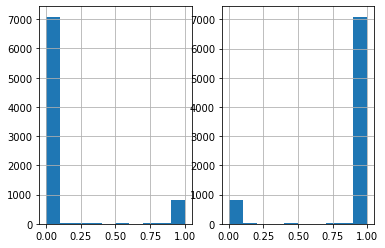

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2)

df_pred_stance['is_Related'].hist(ax=axes[0])
df_pred_stance['is_Unrelated'].hist(ax=axes[1])

In [ ]:
df_pred_stance['is_Related']       = approximate_predictions(df_pred_stance['is_Related'], to_int=True)
df_pred_stance['is_Unrelated']     = approximate_predictions(df_pred_stance['is_Unrelated'], to_int=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


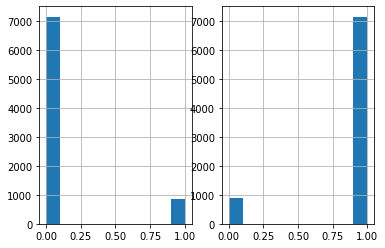

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2)

df_pred_stance['is_Related'].hist(ax=axes[0])
df_pred_stance['is_Unrelated'].hist(ax=axes[1])

Check if the predictions correctly classified the classes as exclusive

In [ ]:
print("Double negatives: ", len(df_pred_stance[(df_pred_stance['is_Related'] == 0.0) & (df_pred_stance['is_Unrelated'] == 0.0)]))
print("Double positives: ", len(df_pred_stance[(df_pred_stance['is_Related'] == 1.0) & (df_pred_stance['is_Unrelated'] == 1.0)]))

Double negatives:  3
Double positives:  0


Compute confusion matrix and classification report on column "is_Related"

In [ ]:
confusion_matrix(df_stance["is_Related"].tolist(), df_pred_stance["is_Related"].astype(int).tolist())

array([[7120,   15],
       [  28,  855]])

In [ ]:
print(classification_report(df_stance["is_Related"].tolist(), df_pred_stance["is_Related"].astype(int).tolist(), target_names=['Unrelated','Related']))

              precision    recall  f1-score   support

   Unrelated       1.00      1.00      1.00      7135
     Related       0.98      0.97      0.98       883

    accuracy                           0.99      8018
   macro avg       0.99      0.98      0.99      8018
weighted avg       0.99      0.99      0.99      8018



 - Inference data

Retrieve test and predictions data related to Inference dataset

In [ ]:
df_inference = df_test[df_test['original_df'] == 'Inference']
df_inference.drop(df_inference.columns.difference(['is_entailment', 'is_contradiction']), axis=1, inplace=True)
df_inference.head()

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,is_entailment,is_contradiction
8018,0.0,1.0
8019,1.0,0.0
8020,1.0,0.0
8021,1.0,0.0
8022,0.0,1.0


In [ ]:
df_pred_inference = df_pred[len(df_stance):(len(df_stance) + len(df_inference))]
df_pred_inference.drop(df_pred_inference.columns.difference(['is_entailment', 'is_contradiction']), axis=1, inplace=True)
df_pred_inference.head()

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,is_entailment,is_contradiction
8018,"('is_entailment', 0.012340563)","('is_contradiction', 0.9880904)"
8019,"('is_entailment', 0.93733716)","('is_contradiction', 0.06237585)"
8020,"('is_entailment', 0.96657526)","('is_contradiction', 0.03194218)"
8021,"('is_entailment', 0.8731754)","('is_contradiction', 0.12510362)"
8022,"('is_entailment', 0.5818535)","('is_contradiction', 0.42678225)"


We can now clean the data

In [ ]:
df_pred_inference['is_entailment']       = split_tuples(df_pred_inference['is_entailment'])
df_pred_inference['is_contradiction']    = split_tuples(df_pred_inference['is_contradiction'])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


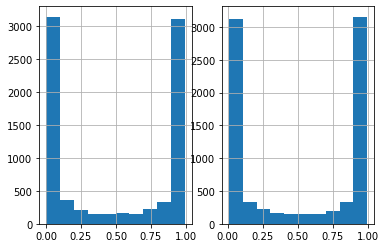

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2)

df_pred_inference['is_entailment'].hist(ax=axes[0])
df_pred_inference['is_contradiction'].hist(ax=axes[1])

In [ ]:
df_pred_inference['is_entailment']       = approximate_predictions(df_pred_inference['is_entailment'], to_int=True)
df_pred_inference['is_contradiction']    = approximate_predictions(df_pred_inference['is_contradiction'], to_int=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


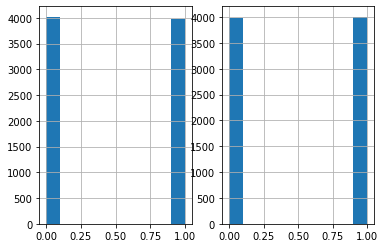

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2)

df_pred_inference['is_entailment'].hist(ax=axes[0])
df_pred_inference['is_contradiction'].hist(ax=axes[1])

Check if the predictions correctly classified the classes as exclusive

In [ ]:
print("Double negatives: ", len(df_pred_inference[(df_pred_inference['is_entailment'] == 0.0) & (df_pred_inference['is_contradiction'] == 0.0)]))
print("Double positives: ", len(df_pred_inference[(df_pred_inference['is_entailment'] == 1.0) & (df_pred_inference['is_contradiction'] == 1.0)]))

Double negatives:  18
Double positives:  5


Compute confusion matrix and classification report on column "is_entailment"

In [ ]:
confusion_matrix(df_inference["is_entailment"].tolist(), df_pred_inference["is_entailment"].astype(int).tolist())

array([[3713,  304],
       [ 308, 3666]])

In [ ]:
print(classification_report(df_inference["is_entailment"].tolist(), df_pred_inference["is_entailment"].astype(int).tolist(), target_names=['Contradiction','Entailment']))

               precision    recall  f1-score   support

Contradiction       0.92      0.92      0.92      4017
   Entailment       0.92      0.92      0.92      3974

     accuracy                           0.92      7991
    macro avg       0.92      0.92      0.92      7991
 weighted avg       0.92      0.92      0.92      7991



 - Agreement data

Retrieve test and predictions data related to Inference dataset

In [ ]:
df_agreement = df_test[df_test['original_df'] == 'Agreement']
df_agreement.drop(df_agreement.columns.difference(['is_agreement', 'is_disagreement']), axis=1, inplace=True)
df_agreement.head()

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,is_agreement,is_disagreement
16009,1.0,0.0
16010,0.0,1.0
16011,0.0,1.0
16012,0.0,1.0
16013,0.0,1.0


In [ ]:
df_pred_agreement = df_pred[(len(df_stance) + len(df_inference)):]
df_pred_agreement.drop(df_pred_agreement.columns.difference(['is_agreement', 'is_disagreement']), axis=1, inplace=True)
df_pred_agreement.head()

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,is_agreement,is_disagreement
16009,"('is_agreement', 0.88655835)","('is_disagreement', 0.118536755)"
16010,"('is_agreement', 0.3085561)","('is_disagreement', 0.68146616)"
16011,"('is_agreement', 0.4456392)","('is_disagreement', 0.55846554)"
16012,"('is_agreement', 0.8640555)","('is_disagreement', 0.13171627)"
16013,"('is_agreement', 0.8058502)","('is_disagreement', 0.19721116)"


We can now clean the data

In [ ]:
df_pred_agreement['is_agreement']       = split_tuples(df_pred_agreement['is_agreement'])
df_pred_agreement['is_disagreement']    = split_tuples(df_pred_agreement['is_disagreement'])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


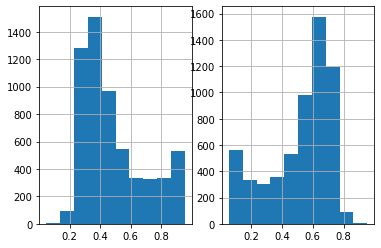

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2)

df_pred_agreement['is_agreement'].hist(ax=axes[0])
df_pred_agreement['is_disagreement'].hist(ax=axes[1])

In [ ]:
df_pred_agreement['is_agreement']       = approximate_predictions(df_pred_agreement['is_agreement'], to_int=True)
df_pred_agreement['is_disagreement']    = approximate_predictions(df_pred_agreement['is_disagreement'], to_int=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


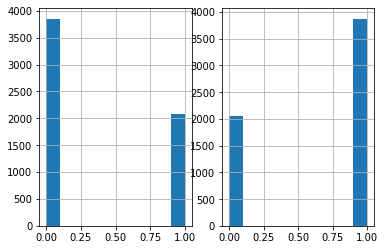

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2)

df_pred_agreement['is_agreement'].hist(ax=axes[0])
df_pred_agreement['is_disagreement'].hist(ax=axes[1])

Check if the predictions correctly classified the classes as exclusive

In [ ]:
print("Double negatives: ", len(df_pred_agreement[(df_pred_agreement['is_agreement'] == 0.0) & (df_pred_agreement['is_disagreement'] == 0.0)]))
print("Double positives: ", len(df_pred_agreement[(df_pred_agreement['is_agreement'] == 1.0) & (df_pred_agreement['is_disagreement'] == 1.0)]))

Double negatives:  42
Double positives:  63


Compute confusion matrix and classification report on column "is_entailment"

In [ ]:
confusion_matrix(df_agreement["is_agreement"].tolist(), df_pred_agreement["is_agreement"].astype(int).tolist())

array([[2538,  570],
       [1314, 1507]])

In [ ]:
print(classification_report(df_agreement["is_agreement"].tolist(), df_pred_agreement["is_agreement"].astype(int).tolist(), target_names=['Disagreement','Agreement']))

              precision    recall  f1-score   support

Disagreement       0.66      0.82      0.73      3108
   Agreement       0.73      0.53      0.62      2821

    accuracy                           0.68      5929
   macro avg       0.69      0.68      0.67      5929
weighted avg       0.69      0.68      0.68      5929



### Setup #3: Parallel setup with frozen Bert layers
This setup resembles the model built in [this paper](https://arxiv.org/abs/1901.11504). There the authors built a system which shares lower layers among different tasks, while separating the last layer (the classifier one).
In our setup, we freeze Bert layers while training the model on the single datasets, while sharing the weights of Bert itself among all datasets.

 - Training of BERT layers on aggregated dataset

In [ ]:
#Creating a uniform one-hot encoding system for all the datasets
dataset_stance_multi_label = pd.concat([dataset_stance['article'], pd.get_dummies(dataset_stance['Stance'], prefix="is")], axis=1)
dataset_stance_multi_label['is_entailment'] = 0.5
dataset_stance_multi_label['is_contradiction'] = 0.5
dataset_stance_multi_label['is_agreement'] = 0.5
dataset_stance_multi_label['is_disagreement'] = 0.5


dataset_inference_multi_label = pd.concat([dataset_inference['sentence'], pd.get_dummies(dataset_inference['gold_label'], prefix="is")], axis=1)
dataset_inference_multi_label['is_Related'] = 1
dataset_inference_multi_label['is_Unrelated'] = 0
dataset_inference_multi_label['is_agreement'] = dataset_inference_multi_label.apply(lambda row: 0.5 if row['is_entailment'] == 1 else 0, axis=1)
dataset_inference_multi_label['is_disagreement'] = 1 - dataset_inference_multi_label['is_agreement']

dataset_agreement_multi_label = pd.concat([dataset_agreement['sentence'], pd.get_dummies(dataset_agreement['label'], prefix='is')], axis=1)
dataset_agreement_multi_label['is_Related'] = 1
dataset_agreement_multi_label['is_Unrelated'] = 0
dataset_agreement_multi_label['is_entailment'] = dataset_agreement_multi_label['is_agreement']
dataset_agreement_multi_label['is_contradiction'] = 1 - dataset_agreement_multi_label['is_entailment']

#Rename the columns to allow the aggregation
dataset_stance_multi_label.rename(columns={'article':'text'}, inplace=True)
dataset_inference_multi_label.rename(columns={'sentence':'text'}, inplace=True)
dataset_agreement_multi_label.rename(columns={'sentence':'text'}, inplace=True)

In [ ]:
#Split into train/test set
(dataset_stance_multi_label_train, dataset_stance_multi_label_test) = split_dataset(dataset_stance_multi_label)
(dataset_inference_multi_label_train, dataset_inference_multi_label_test) = split_dataset(dataset_inference_multi_label)
(dataset_agreement_multi_label_train, dataset_agreement_multi_label_test) = split_dataset(dataset_agreement_multi_label)

#Aggregate
dataset_multi_label_train = pd.concat([dataset_stance_multi_label_train, dataset_inference_multi_label_train, dataset_agreement_multi_label_train])
dataset_multi_label_train.head()

,text,is_Related,is_Unrelated,is_entailment,is_contradiction,is_agreement,is_disagreement
0,"[CLS] Vice Media’s CEO blew $300,000 on dinner...",0,1,0.5,0.5,0.5,0.5
2,[CLS] Meteorite leaves crater in Nicaraguan ca...,1,0,0.5,0.5,0.5,0.5
3,[CLS] This Is The Most Epic Way To Quit Your J...,1,0,0.5,0.5,0.5,0.5
4,[CLS] Al-Shabab leader who ordered Kenya mall ...,0,1,0.5,0.5,0.5,0.5
5,[CLS] Vogue's new digs are reportedly swarming...,0,1,0.5,0.5,0.5,0.5


In [ ]:
#Preprocess text
(x_train, y_train), (x_test, y_test), preproc = text.texts_from_df(dataset_multi_label_train, 
                                                                   'text',
                                                                   label_columns=['is_Related', 'is_Unrelated', 'is_entailment', 'is_contradiction', 'is_agreement', 'is_disagreement'],
                                                                   maxlen=75, 
                                                                   max_features=100000,
                                                                   preprocess_mode='bert',
                                                                   val_pct=0.1,
                                                                   ngram_range=3)

#Build a model and train it
model = text.text_classifier('bert', (x_train, y_train) , preproc=preproc)
learner = ktrain.get_learner(model, 
                             train_data=(x_train, y_train), 
                             val_data=(x_test, y_test), 
                             batch_size=32)
learner.autofit(5e-5, 4)

downloading pretrained BERT model (uncased_L-12_H-768_A-12.zip)...
[██████████████████████████████████████████████████]
extracting pretrained BERT model...
done.

cleanup downloaded zip...
done.

preprocessing train...
language: en


Is Multi-Label? True
preprocessing test...
language: en


Is Multi-Label? True
maxlen is 75
done.


begin training using triangular learning rate policy with max lr of 5e-05...
Train on 79434 samples, validate on 8826 samples
Epoch 1/4
79434/79434 [==============================] - 1381s 17ms/sample - loss: 0.3927 - accuracy: 0.5959 - val_loss: 0.3485 - val_accuracy: 0.6291
Epoch 2/4
79434/79434 [==============================] - 1374s 17ms/sample - loss: 0.3342 - accuracy: 0.6344 - val_loss: 0.3333 - val_accuracy: 0.6415
Epoch 3/4
79434/79434 [==============================] - 1374s 17ms/sample - loss: 0.3102 - accuracy: 0.6467 - val_loss: 0.3339 - val_accuracy: 0.6421
Epoch 4/4
79434/79434 [==============================] - 1375s 17ms/sample - loss: 0.2970 - accuracy: 0.6527 - val_loss: 0.3353 - val_accuracy: 0.6444


In [ ]:
# save model and Preprocessor instance after partially training
ktrain.get_predictor(learner.model, preproc).save('/tmp/my_predictor')

 - Stance Detection dataset

In [ ]:
# reload Predictor and extract model
model = ktrain.load_predictor('/tmp/my_predictor').model

In [ ]:
#Preprocess data
(x_train, y_train), (x_test, y_test), preproc = text.texts_from_df(dataset_stance_multi_label_train, 
                                                                   'text',
                                                                   label_columns=['is_Related', 'is_Unrelated', 'is_entailment', 'is_contradiction', 'is_agreement', 'is_disagreement'],
                                                                   maxlen=75, 
                                                                   max_features=100000,
                                                                   preprocess_mode='bert',
                                                                   val_pct=0.1,
                                                                   ngram_range=3)

#Create new learner
learner = ktrain.get_learner(model, 
                             train_data=(x_train, y_train), 
                             val_data=(x_test, y_test), 
                             batch_size=32)

#Freeze BERT layers
learner.freeze()

#Fit model
learner.fit_onecycle(5e-5, 1)


preprocessing train...
language: en


Is Multi-Label? True
preprocessing test...
language: en




begin training using onecycle policy with max lr of 5e-05...
Train on 29568 samples, validate on 3286 samples
29568/29568 [==============================] - 133s 4ms/sample - loss: 0.4635 - accuracy: 0.3329 - val_loss: 0.4628 - val_accuracy: 0.3331


In [ ]:
#Predict values in test set and check results
predictor = ktrain.get_predictor(learner.model, preproc=preproc)
predictions_stance = return_predictions(dataset_stance_multi_label_test, predictor)

Percentage completion: 0.00%


Percentage completion: 1.00%


Percentage completion: 2.00%


Percentage completion: 3.00%


Percentage completion: 4.00%


Percentage completion: 4.99%


Percentage completion: 5.99%


Percentage completion: 6.99%


Percentage completion: 7.99%


Percentage completion: 8.99%


Percentage completion: 9.99%


Percentage completion: 10.99%


Percentage completion: 11.99%


Percentage completion: 12.99%


Percentage completion: 13.98%


Percentage completion: 14.98%


Percentage completion: 15.98%


Percentage completion: 16.98%


Percentage completion: 17.98%


Percentage completion: 18.98%


Percentage completion: 19.98%


Percentage completion: 20.98%


Percentage completion: 21.98%


Percentage completion: 22.97%


Percentage completion: 23.97%


Percentage completion: 24.97%


Percentage completion: 25.97%


Percentage completion: 26.97%


Percentage completion: 27.97%


Percentage completion: 28.97%


Percentage completion: 29.97%


Percentage completion: 30.97%


Percentage completion: 31.96%


Percentage completion: 32.96%


Percentage completion: 33.96%


Percentage completion: 34.96%


Percentage completion: 35.96%


Percentage completion: 36.96%


Percentage completion: 37.96%


Percentage completion: 38.96%


Percentage completion: 39.96%


Percentage completion: 40.96%


Percentage completion: 41.95%


Percentage completion: 42.95%


Percentage completion: 43.95%


Percentage completion: 44.95%


Percentage completion: 45.95%


Percentage completion: 46.95%


Percentage completion: 47.95%


Percentage completion: 48.95%


Percentage completion: 49.95%


Percentage completion: 50.94%


Percentage completion: 51.94%


Percentage completion: 52.94%


Percentage completion: 53.94%


Percentage completion: 54.94%


Percentage completion: 55.94%


Percentage completion: 56.94%


Percentage completion: 57.94%


Percentage completion: 58.94%


Percentage completion: 59.93%


Percentage completion: 60.93%


Percentage completion: 61.93%


Percentage completion: 62.93%


Percentage completion: 63.93%


Percentage completion: 64.93%


Percentage completion: 65.93%


Percentage completion: 66.93%


Percentage completion: 67.93%


Percentage completion: 68.92%


Percentage completion: 69.92%


Percentage completion: 70.92%


Percentage completion: 71.92%


Percentage completion: 72.92%


Percentage completion: 73.92%


Percentage completion: 74.92%


Percentage completion: 75.92%


Percentage completion: 76.92%


Percentage completion: 77.91%


Percentage completion: 78.91%


Percentage completion: 79.91%


Percentage completion: 80.91%


Percentage completion: 81.91%


Percentage completion: 82.91%


Percentage completion: 83.91%


Percentage completion: 84.91%


Percentage completion: 85.91%


Percentage completion: 86.90%


Percentage completion: 87.90%


Percentage completion: 88.90%


Percentage completion: 89.90%


Percentage completion: 90.90%


Percentage completion: 91.90%


Percentage completion: 92.90%


Percentage completion: 93.90%


Percentage completion: 94.90%


Percentage completion: 95.89%


Percentage completion: 96.89%


Percentage completion: 97.89%


Percentage completion: 98.89%


Percentage completion: 99.89%


In [ ]:
#Prepare file with predictions and test data
df_prediction_stance = pd.DataFrame(predictions_stance)
df_prediction_stance.to_csv("predictions_stance.csv")
dataset_stance_multi_label_test.to_csv("test_stance.csv")

#Download
files.download('predictions_stance.csv')
files.download('test_stance.csv') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

To evaluate the data, we need first to clean the prediction dataset

I saved the test and predictions data on my GitHub. To download it, without repeating all the steps again, execute this cell

In [ ]:
!wget https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/test_stance.csv
!wget https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/predictions_stance.csv

--2020-08-18 16:23:02--  https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/test_stance.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 18943475 (18M) [text/plain]
Saving to: ‘test_stance.csv’

test_stance.csv     100%[===================>]  18.07M  27.1MB/s    in 0.7s    

2020-08-18 16:23:06 (27.1 MB/s) - ‘test_stance.csv’ saved [18943475/18943475]

--2020-08-18 16:23:08--  https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/predictions_stance.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response..

Now we can clean the test data

In [ ]:
df = pd.read_csv("test_stance.csv")
df.drop(df.columns.difference(['is_Related', 'is_Unrelated']), axis=1, inplace=True)
df.head()

,is_Related,is_Unrelated
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1


And the predictions data

In [ ]:
df_pred = pd.read_csv("predictions_stance.csv")
df_pred.rename(columns={"0":"is_Related", "1":"is_Unrelated", "2":"is_entailment", "3":"is_contradiction", "4":"is_agreement", "5":"is_disagreement"}, inplace=True)
df_pred.drop(df_pred.columns.difference(['is_Related', 'is_Unrelated']), axis=1, inplace=True)
df_pred.head()

,is_Related,is_Unrelated
0,"('is_Related', 5.3996715e-05)","('is_Unrelated', 0.9999536)"
1,"('is_Related', 8.5387444e-05)","('is_Unrelated', 0.99994004)"
2,"('is_Related', 0.00011100022)","('is_Unrelated', 0.9999274)"
3,"('is_Related', 7.542242e-05)","('is_Unrelated', 0.9999417)"
4,"('is_Related', 7.8781595e-05)","('is_Unrelated', 0.999944)"


In [ ]:
df_pred['is_Related']       = split_tuples(df_pred['is_Related'])
df_pred['is_Unrelated']     = split_tuples(df_pred['is_Unrelated'])

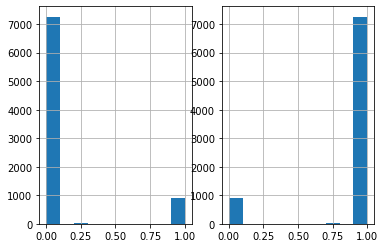

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2)

df_pred['is_Related'].hist(ax=axes[0])
df_pred['is_Unrelated'].hist(ax=axes[1])

In [ ]:
df_pred['is_Related']       = approximate_predictions(df_pred['is_Related'], to_int=True)
df_pred['is_Unrelated']     = approximate_predictions(df_pred['is_Unrelated'], to_int=True)

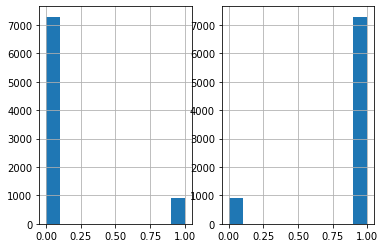

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2)

df_pred['is_Related'].hist(ax=axes[0])
df_pred['is_Unrelated'].hist(ax=axes[1])

Check if the predictions correctly classified the classes as exclusive

In [ ]:
print("Double negatives: ", len(df_pred[(df_pred['is_Related'] == 0.0) & (df_pred['is_Unrelated'] == 0.0)]))
print("Double positives: ", len(df_pred[(df_pred['is_Related'] == 1.0) & (df_pred['is_Unrelated'] == 1.0)]))

Double negatives:  0
Double positives:  0


Compute confusion matrix and classification report on column "is_Related"

In [ ]:
confusion_matrix(df["is_Related"].tolist(), df_pred["is_Related"].astype(int).tolist())

array([[7269,    7],
       [  17,  916]])

In [ ]:
print(classification_report(df["is_Related"].tolist(), df_pred["is_Related"].astype(int).tolist(), target_names=['Unrelated','Related']))

              precision    recall  f1-score   support

   Unrelated       1.00      1.00      1.00      7276
     Related       0.99      0.98      0.99       933

    accuracy                           1.00      8209
   macro avg       1.00      0.99      0.99      8209
weighted avg       1.00      1.00      1.00      8209



 - Stanford NLI dataset

In [ ]:
# reload Predictor and extract model
model = ktrain.load_predictor('/tmp/my_predictor').model

In [ ]:
dataset_inference_multi_label_train['is_Related'] = 0.5
dataset_inference_multi_label_train['is_Unrelated'] = 0.5
dataset_inference_multi_label_train['is_agreement'] = 0.5
dataset_inference_multi_label_train['is_disagreement'] = 0.5

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [ ]:
#Preprocess data
(x_train, y_train), (x_test, y_test), preproc = text.texts_from_df(dataset_inference_multi_label_train, 
                                                                   'text',
                                                                   label_columns=['is_Related', 'is_Unrelated', 'is_entailment', 'is_contradiction', 'is_agreement', 'is_disagreement'],
                                                                   maxlen=75, 
                                                                   max_features=100000,
                                                                   preprocess_mode='bert',
                                                                   val_pct=0.1,
                                                                   ngram_range=3)

#Create new learner
learner = ktrain.get_learner(model, 
                             train_data=(x_train, y_train), 
                             val_data=(x_test, y_test), 
                             batch_size=32)


#Freeze BERT layers
learner.freeze()

#Fit model
learner.fit_onecycle(5e-5, 4)

preprocessing train...
language: en


Is Multi-Label? True
preprocessing test...
language: en




begin training using onecycle policy with max lr of 5e-05...
Train on 28765 samples, validate on 3197 samples
Epoch 1/4
28765/28765 [==============================] - 136s 5ms/sample - loss: 1.4174 - accuracy: 0.3280 - val_loss: 0.6484 - val_accuracy: 0.3291
Epoch 2/4
28765/28765 [==============================] - 126s 4ms/sample - loss: 0.5164 - accuracy: 0.3280 - val_loss: 0.4914 - val_accuracy: 0.3290
Epoch 3/4
28765/28765 [==============================] - 126s 4ms/sample - loss: 0.4856 - accuracy: 0.3282 - val_loss: 0.4827 - val_accuracy: 0.3290
Epoch 4/4
28765/28765 [==============================] - 126s 4ms/sample - loss: 0.4823 - accuracy: 0.3284 - val_loss: 0.4817 - val_accuracy: 0.3291


NameError: ignored

In [ ]:
#Predict values in test set and check results
predictor = ktrain.get_predictor(learner.model, preproc=preproc)
predictions_inference = return_predictions(dataset_inference_multi_label_test, predictor)

Percentage completion: 0.00%


Percentage completion: 1.00%


Percentage completion: 1.99%


Percentage completion: 2.99%


Percentage completion: 3.98%


Percentage completion: 4.98%


Percentage completion: 5.97%


Percentage completion: 6.97%


Percentage completion: 7.96%


Percentage completion: 8.96%


Percentage completion: 9.95%


Percentage completion: 10.95%


Percentage completion: 11.94%


Percentage completion: 12.94%


Percentage completion: 13.93%


Percentage completion: 14.93%


Percentage completion: 15.92%


Percentage completion: 16.92%


Percentage completion: 17.91%


Percentage completion: 18.91%


Percentage completion: 19.91%


Percentage completion: 20.90%


Percentage completion: 21.90%


Percentage completion: 22.89%


Percentage completion: 23.89%


Percentage completion: 24.88%


Percentage completion: 25.88%


Percentage completion: 26.87%


Percentage completion: 27.87%


Percentage completion: 28.86%


Percentage completion: 29.86%


Percentage completion: 30.85%


Percentage completion: 31.85%


Percentage completion: 32.84%


Percentage completion: 33.84%


Percentage completion: 34.83%


Percentage completion: 35.83%


Percentage completion: 36.83%


Percentage completion: 37.82%


Percentage completion: 38.82%


Percentage completion: 39.81%


Percentage completion: 40.81%


Percentage completion: 41.80%


Percentage completion: 42.80%


Percentage completion: 43.79%


Percentage completion: 44.79%


Percentage completion: 45.78%


Percentage completion: 46.78%


Percentage completion: 47.77%


Percentage completion: 48.77%


Percentage completion: 49.76%


Percentage completion: 50.76%


Percentage completion: 51.75%


Percentage completion: 52.75%


Percentage completion: 53.74%


Percentage completion: 54.74%


Percentage completion: 55.74%


Percentage completion: 56.73%


Percentage completion: 57.73%


Percentage completion: 58.72%


Percentage completion: 59.72%


Percentage completion: 60.71%


Percentage completion: 61.71%


Percentage completion: 62.70%


Percentage completion: 63.70%


Percentage completion: 64.69%


Percentage completion: 65.69%


Percentage completion: 66.68%


Percentage completion: 67.68%


Percentage completion: 68.67%


Percentage completion: 69.67%


Percentage completion: 70.66%


Percentage completion: 71.66%


Percentage completion: 72.65%


Percentage completion: 73.65%


Percentage completion: 74.65%


Percentage completion: 75.64%


Percentage completion: 76.64%


Percentage completion: 77.63%


Percentage completion: 78.63%


Percentage completion: 79.62%


Percentage completion: 80.62%


Percentage completion: 81.61%


Percentage completion: 82.61%


Percentage completion: 83.60%


Percentage completion: 84.60%


Percentage completion: 85.59%


Percentage completion: 86.59%


Percentage completion: 87.58%


Percentage completion: 88.58%


Percentage completion: 89.57%


Percentage completion: 90.57%


Percentage completion: 91.57%


Percentage completion: 92.56%


Percentage completion: 93.56%


Percentage completion: 94.55%


Percentage completion: 95.55%


Percentage completion: 96.54%


Percentage completion: 97.54%


Percentage completion: 98.53%


Percentage completion: 99.53%


In [ ]:
#Prepare file with predictions and test data
df_prediction_inference = pd.DataFrame(predictions_inference)
df_prediction_inference.to_csv("predictions_inference.csv")
dataset_inference_multi_label_test.to_csv("test_inference.csv")

#Download
files.download('predictions_inference.csv')
files.download('test_inference.csv') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

I saved the test and predictions data on my GitHub. To download it, without repeating all the steps again, execute this cell

In [ ]:
!wget https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/test_inference.csv
!wget https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/predictions_inference.csv

--2020-08-18 16:24:22--  https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/test_inference.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1106511 (1.1M) [text/plain]
Saving to: ‘test_inference.csv’

test_inference.csv  100%[===================>]   1.05M  --.-KB/s    in 0.1s    

2020-08-18 16:24:24 (7.63 MB/s) - ‘test_inference.csv’ saved [1106511/1106511]

--2020-08-18 16:24:26--  https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/predictions_inference.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting 

Now we can clean the test data

In [ ]:
df = pd.read_csv("test_inference.csv")
df.drop(df.columns.difference(['is_entailment', 'is_contradiction']), axis=1, inplace=True)
df.head()

,is_contradiction,is_entailment
0,0,1
1,1,0
2,1,0
3,1,0
4,1,0


And the predictions data

In [ ]:
df_pred = pd.read_csv("predictions_inference.csv")
df_pred.rename(columns={"0":"is_Related", "1":"is_Unrelated", "2":"is_entailment", "3":"is_contradiction", "4":"is_agreement", "5":"is_disagreement"}, inplace=True)
df_pred.drop(df_pred.columns.difference(['is_entailment', 'is_contradiction']), axis=1, inplace=True)
df_pred.head()

,is_entailment,is_contradiction
0,"('is_entailment', 0.23301311)","('is_contradiction', 0.7581337)"
1,"('is_entailment', 0.002028775)","('is_contradiction', 0.99804795)"
2,"('is_entailment', 0.00032026102)","('is_contradiction', 0.99966943)"
3,"('is_entailment', 0.0002948888)","('is_contradiction', 0.9996847)"
4,"('is_entailment', 0.0003130614)","('is_contradiction', 0.9996124)"


In [ ]:
df_pred['is_entailment']       = split_tuples(df_pred['is_entailment'])
df_pred['is_contradiction']    = split_tuples(df_pred['is_contradiction'])

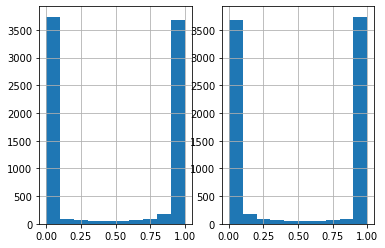

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2)

df_pred['is_entailment'].hist(ax=axes[0])
df_pred['is_contradiction'].hist(ax=axes[1])

In [ ]:
df_pred['is_entailment']        = approximate_predictions(df_pred['is_entailment'], to_int=True)
df_pred['is_contradiction']     = approximate_predictions(df_pred['is_contradiction'], to_int=True)

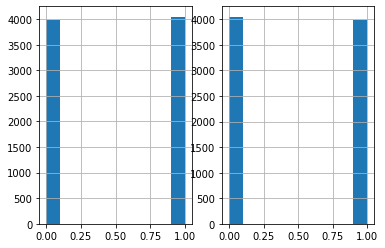

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2)

df_pred['is_entailment'].hist(ax=axes[0])
df_pred['is_contradiction'].hist(ax=axes[1])

Check if the predictions correctly classified the classes as exclusive. There were 3 cases where this did not happen. Given the small amount of rows involved, we can overlook this issue.

In [ ]:
print("Double negatives: ", len(df_pred[(df_pred['is_entailment'] == 0.0) & (df_pred['is_contradiction'] == 0.0)]))
print("Double positives: ", len(df_pred[(df_pred['is_entailment'] == 1.0) & (df_pred['is_contradiction'] == 1.0)]))

Double negatives:  3
Double positives:  0


Compute confusion matrix and classification report on column "is_entailment"

In [ ]:
confusion_matrix(df["is_entailment"].tolist(), df_pred["is_entailment"].astype(int).tolist())

array([[3748,  301],
       [ 243, 3746]])

In [ ]:
print(classification_report(df["is_entailment"].tolist(), df_pred["is_entailment"].astype(int).tolist(), target_names=['Contradiction','Entailment']))

               precision    recall  f1-score   support

Contradiction       0.94      0.93      0.93      4049
   Entailment       0.93      0.94      0.93      3989

     accuracy                           0.93      8038
    macro avg       0.93      0.93      0.93      8038
 weighted avg       0.93      0.93      0.93      8038



 - Debates agreement/disagreement

In [ ]:
# reload Predictor and extract model
model = ktrain.load_predictor('/tmp/my_predictor').model

In [ ]:
dataset_agreement_multi_label_train['is_Related'] = 0.5
dataset_agreement_multi_label_train['is_Unrelated'] = 0.5
dataset_agreement_multi_label_train['is_entailment'] = 0.5
dataset_agreement_multi_label_train['is_contradiction'] = 0.5

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [ ]:
#Preprocess data
(x_train, y_train), (x_test, y_test), preproc = text.texts_from_df(dataset_agreement_multi_label_train, 
                                                                   'text',
                                                                   label_columns=['is_Related', 'is_Unrelated', 'is_entailment', 'is_contradiction', 'is_agreement', 'is_disagreement'],
                                                                   maxlen=75, 
                                                                   max_features=100000,
                                                                   preprocess_mode='bert',
                                                                   val_pct=0.1,
                                                                   ngram_range=3)

#Create new learner
learner = ktrain.get_learner(model, 
                             train_data=(x_train, y_train), 
                             val_data=(x_test, y_test), 
                             batch_size=32)


#Freeze BERT layers
learner.freeze()

#Fit model
learner.fit_onecycle(5e-5, 4)

preprocessing train...
language: en


Is Multi-Label? True
preprocessing test...
language: en




begin training using onecycle policy with max lr of 5e-05...
Train on 21099 samples, validate on 2345 samples
Epoch 1/4
21099/21099 [==============================] - 101s 5ms/sample - loss: 1.3020 - accuracy: 0.2754 - val_loss: 0.7890 - val_accuracy: 0.2800
Epoch 2/4
21099/21099 [==============================] - 93s 4ms/sample - loss: 0.6750 - accuracy: 0.2754 - val_loss: 0.6271 - val_accuracy: 0.2805
Epoch 3/4
21099/21099 [==============================] - 93s 4ms/sample - loss: 0.6023 - accuracy: 0.2756 - val_loss: 0.5891 - val_accuracy: 0.2805
Epoch 4/4
21099/21099 [==============================] - 93s 4ms/sample - loss: 0.5873 - accuracy: 0.2762 - val_loss: 0.5833 - val_accuracy: 0.2806


NameError: ignored

In [ ]:
#Predict values in test set and check results
predictor = ktrain.get_predictor(learner.model, preproc=preproc)
predictions_agreement = return_predictions(dataset_agreement_multi_label_test, predictor)

Percentage completion: 0.00%


Percentage completion: 0.98%


Percentage completion: 1.97%


Percentage completion: 2.95%


Percentage completion: 3.93%


Percentage completion: 4.92%


Percentage completion: 5.90%


Percentage completion: 6.88%


Percentage completion: 7.87%


Percentage completion: 8.85%


Percentage completion: 9.84%


Percentage completion: 10.82%


Percentage completion: 11.80%


Percentage completion: 12.79%


Percentage completion: 13.77%


Percentage completion: 14.75%


Percentage completion: 15.74%


Percentage completion: 16.72%


Percentage completion: 17.70%


Percentage completion: 18.69%


Percentage completion: 19.67%


Percentage completion: 20.65%


Percentage completion: 21.64%


Percentage completion: 22.62%


Percentage completion: 23.61%


Percentage completion: 24.59%


Percentage completion: 25.57%


Percentage completion: 26.56%


Percentage completion: 27.54%


Percentage completion: 28.52%


Percentage completion: 29.51%


Percentage completion: 30.49%


Percentage completion: 31.47%


Percentage completion: 32.46%


Percentage completion: 33.44%


Percentage completion: 34.42%


Percentage completion: 35.41%


Percentage completion: 36.39%


Percentage completion: 37.37%


Percentage completion: 38.36%


Percentage completion: 39.34%


Percentage completion: 40.33%


Percentage completion: 41.31%


Percentage completion: 42.29%


Percentage completion: 43.28%


Percentage completion: 44.26%


Percentage completion: 45.24%


Percentage completion: 46.23%


Percentage completion: 47.21%


Percentage completion: 48.19%


Percentage completion: 49.18%


Percentage completion: 50.16%


Percentage completion: 51.14%


Percentage completion: 52.13%


Percentage completion: 53.11%


Percentage completion: 54.10%


Percentage completion: 55.08%


Percentage completion: 56.06%


Percentage completion: 57.05%


Percentage completion: 58.03%


Percentage completion: 59.01%


Percentage completion: 60.00%


Percentage completion: 60.98%


Percentage completion: 61.96%


Percentage completion: 62.95%


Percentage completion: 63.93%


Percentage completion: 64.91%


Percentage completion: 65.90%


Percentage completion: 66.88%


Percentage completion: 67.87%


Percentage completion: 68.85%


Percentage completion: 69.83%


Percentage completion: 70.82%


Percentage completion: 71.80%


Percentage completion: 72.78%


Percentage completion: 73.77%


Percentage completion: 74.75%


Percentage completion: 75.73%


Percentage completion: 76.72%


Percentage completion: 77.70%


Percentage completion: 78.68%


Percentage completion: 79.67%


Percentage completion: 80.65%


Percentage completion: 81.63%


Percentage completion: 82.62%


Percentage completion: 83.60%


Percentage completion: 84.59%


Percentage completion: 85.57%


Percentage completion: 86.55%


Percentage completion: 87.54%


Percentage completion: 88.52%


Percentage completion: 89.50%


Percentage completion: 90.49%


Percentage completion: 91.47%


Percentage completion: 92.45%


Percentage completion: 93.44%


Percentage completion: 94.42%


Percentage completion: 95.40%


Percentage completion: 96.39%


Percentage completion: 97.37%


Percentage completion: 98.36%


Percentage completion: 99.34%


In [ ]:
#Prepare file with predictions and test data
df_prediction_agreement = pd.DataFrame(predictions_agreement)
df_prediction_agreement.to_csv("predictions_agreement.csv")
dataset_agreement_multi_label_test.to_csv("test_agreement.csv")

#Download
files.download('predictions_agreement.csv')
files.download('test_agreement.csv') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

I saved the test and predictions data on my GitHub. To download it, without repeating all the steps again, execute this cell

In [ ]:
!wget https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/test_agreement.csv
!wget https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/predictions_agreement.csv

--2020-08-18 16:25:51--  https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/test_agreement.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5685070 (5.4M) [text/plain]
Saving to: ‘test_agreement.csv.1’

test_agreement.csv. 100%[===================>]   5.42M  19.1MB/s    in 0.3s    

2020-08-18 16:25:54 (19.1 MB/s) - ‘test_agreement.csv.1’ saved [5685070/5685070]

--2020-08-18 16:25:56--  https://raw.githubusercontent.com/steflyx/Automatic-Fact-Checking-System/master/predictions_agreement.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, await

Now we can clean the test data

In [ ]:
df = pd.read_csv("test_agreement.csv")
df.drop(df.columns.difference(['is_agreement', 'is_disagreement']), axis=1, inplace=True)
df.head()

,is_agreement,is_disagreement
0,1,0
1,0,1
2,1,0
3,0,1
4,0,1


And the predictions data

In [ ]:
df_pred = pd.read_csv("predictions_agreement.csv")
df_pred.rename(columns={"0":"is_Related", "1":"is_Unrelated", "2":"is_entailment", "3":"is_contradiction", "4":"is_agreement", "5":"is_disagreement"}, inplace=True)
df_pred.drop(df_pred.columns.difference(['is_agreement', 'is_disagreement']), axis=1, inplace=True)
df_pred.head()

,is_agreement,is_disagreement
0,"('is_agreement', 0.9934524)","('is_disagreement', 0.0070931567)"
1,"('is_agreement', 0.39210567)","('is_disagreement', 0.60788107)"
2,"('is_agreement', 0.9933056)","('is_disagreement', 0.0064897877)"
3,"('is_agreement', 0.33555812)","('is_disagreement', 0.66342473)"
4,"('is_agreement', 0.19240193)","('is_disagreement', 0.8076237)"


In [ ]:
df_pred['is_agreement']       = split_tuples(df_pred['is_agreement'])
df_pred['is_disagreement']    = split_tuples(df_pred['is_disagreement'])

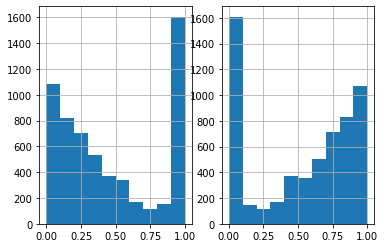

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2)

df_pred['is_agreement'].hist(ax=axes[0])
df_pred['is_disagreement'].hist(ax=axes[1])

In [ ]:
df_pred['is_agreement']        = approximate_predictions(df_pred['is_agreement'], to_int=True)
df_pred['is_disagreement']     = approximate_predictions(df_pred['is_disagreement'], to_int=True)

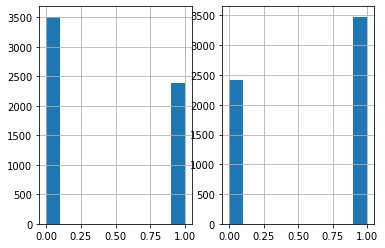

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2)

df_pred['is_agreement'].hist(ax=axes[0])
df_pred['is_disagreement'].hist(ax=axes[1])

Check if the predictions correctly classified the classes as exclusive. This time the number of cases was higher, but still negligible with respect to the number of rows.

In [ ]:
print("Double negatives: ", len(df_pred[(df_pred['is_agreement'] == 0.0) & (df_pred['is_disagreement'] == 0.0)]))
print("Double positives: ", len(df_pred[(df_pred['is_agreement'] == 1.0) & (df_pred['is_disagreement'] == 1.0)]))

Double negatives:  33
Double positives:  2


Compute confusion matrix and classification report on column "is_agreement"

In [ ]:
confusion_matrix(df["is_agreement"].tolist(), df_pred["is_agreement"].astype(int).tolist())

array([[2580,  480],
       [ 930, 1907]])

In [ ]:
print(classification_report(df["is_agreement"].tolist(), df_pred["is_agreement"].astype(int).tolist(), target_names=['Disagreement','Agreement']))

              precision    recall  f1-score   support

Disagreement       0.74      0.84      0.79      3060
   Agreement       0.80      0.67      0.73      2837

    accuracy                           0.76      5897
   macro avg       0.77      0.76      0.76      5897
weighted avg       0.77      0.76      0.76      5897

